In [1]:
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#clean data module
import clean_data
import time
import statistics as st

%matplotlib inline
SEED = 42

## The Data

There are four data files associated with this project:

- `Udacity_AZDIAS_052018.csv`: Demographics data for the general population of Germany; 891 211 persons (rows) x 366 features (columns).
- `Udacity_CUSTOMERS_052018.csv`: Demographics data for customers of a mail-order company; 191 652 persons (rows) x 369 features (columns).
- `Udacity_MAILOUT_052018_TRAIN.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 982 persons (rows) x 367 (columns).
- `Udacity_MAILOUT_052018_TEST.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 833 persons (rows) x 366 (columns).

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighborhood. Use the information from the first two files to figure out how customers ("CUSTOMERS") are similar to or differ from the general population at large ("AZDIAS"), then use your analysis to make predictions on the other two files ("MAILOUT"), predicting which recipients are most likely to become a customer for the mail-order company.

The "CUSTOMERS" file contains three extra columns ('CUSTOMER_GROUP', 'ONLINE_PURCHASE', and 'PRODUCT_GROUP'), which provide broad information about the customers depicted in the file. The original "MAILOUT" file included one additional column, "RESPONSE", which indicated whether or not each recipient became a customer of the company. For the "TRAIN" subset, this column has been retained, but in the "TEST" subset it has been removed; it is against that withheld column that your final predictions will be assessed in the Kaggle competition.

Otherwise, all of the remaining columns are the same between the three data files. For more information about the columns depicted in the files, you can refer to two Excel spreadsheets provided in the workspace. [One of them](./DIAS Information Levels - Attributes 2017.xlsx) is a top-level list of attributes and descriptions, organized by informational category. [The other](./DIAS Attributes - Values 2017.xlsx) is a detailed mapping of data values for each feature in alphabetical order.

In the below cell, we've provided some initial code to load in the first two datasets. Note for all of the `.csv` data files in this project that they're semicolon (`;`) delimited, so an additional argument in the [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call has been included to read in the data properly. Also, considering the size of the datasets, it may take some time for them to load completely.

You'll notice when the data is loaded in that a warning message will immediately pop up. Before you really start digging into the modeling and analysis, you're going to need to perform some cleaning. Take some time to browse the structure of the data and look over the informational spreadsheets to understand the data values. Make some decisions on which features to keep, which features to drop, and if any revisions need to be made on data formats. It'll be a good idea to create a function with pre-processing steps, since you'll need to clean all of the datasets before you work with them.

In [2]:
# load in the data
azdias = pd.read_csv('Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('Udacity_CUSTOMERS_052018.csv', sep=';')

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (18,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


# Part 1: Data Processing and Cleaning

## 1.1 Duplicates and data types

In [3]:
azdias.head(10)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,910215,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,2
1,910220,-1,9.0,0.0,NaN,NaN,NaN,NaN,21.0,11.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,910225,-1,9.0,17.0,NaN,NaN,NaN,NaN,17.0,10.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,910226,2,1.0,13.0,NaN,NaN,NaN,NaN,13.0,1.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,910241,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,3.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3
5,910244,3,1.0,10.0,NaN,NaN,NaN,NaN,10.0,5.0,...,2.0,10.0,7.0,4.0,6.0,9.0,7.0,4,2,1
6,910248,-1,9.0,0.0,NaN,NaN,NaN,NaN,NaN,4.0,...,2.0,7.0,10.0,10.0,3.0,9.0,5.0,4,2,2
7,910261,-1,1.0,14.0,NaN,NaN,NaN,NaN,14.0,6.0,...,2.0,10.0,12.0,9.0,5.0,9.0,1.0,1,1,1
8,645145,-1,9.0,16.0,NaN,NaN,NaN,NaN,16.0,2.0,...,4.0,8.0,11.0,8.0,5.0,8.0,1.0,6,1,3
9,645153,-1,5.0,17.0,NaN,NaN,NaN,NaN,17.0,9.0,...,4.0,1.0,1.0,1.0,4.0,3.0,7.0,4,2,3


In [4]:
customers.head(10)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,...,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,2.0,6.0,9.0,7.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
1,9628,-1,9.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,0.0,9.0,NaN,3,FOOD,SINGLE_BUYER,0,1,4
2,143872,-1,1.0,6.0,NaN,NaN,NaN,NaN,0.0,1.0,...,11.0,6.0,9.0,2.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,2,4
3,143873,1,1.0,8.0,NaN,NaN,NaN,NaN,8.0,0.0,...,2.0,NaN,9.0,7.0,1,COSMETIC,MULTI_BUYER,0,1,4
4,143874,-1,1.0,20.0,NaN,NaN,NaN,NaN,14.0,7.0,...,4.0,2.0,9.0,3.0,1,FOOD,MULTI_BUYER,0,1,3
5,143888,1,1.0,11.0,NaN,NaN,NaN,NaN,10.0,1.0,...,1.0,6.0,9.0,1.0,2,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,3
6,143904,2,1.0,10.0,NaN,NaN,NaN,NaN,10.0,1.0,...,2.0,6.0,9.0,7.0,1,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
7,143910,1,1.0,10.0,NaN,NaN,NaN,NaN,9.0,1.0,...,1.0,6.0,9.0,3.0,3,FOOD,SINGLE_BUYER,0,1,4
8,102160,2,3.0,5.0,NaN,NaN,NaN,NaN,4.0,74.0,...,9.0,6.0,3.0,4.0,3,COSMETIC,MULTI_BUYER,0,2,4
9,102173,1,1.0,20.0,NaN,NaN,NaN,NaN,13.0,1.0,...,4.0,2.0,9.0,5.0,1,COSMETIC,MULTI_BUYER,0,1,3


First, a routine check for duplicate rows.

In [5]:
azdias.duplicated().sum(), customers.duplicated().sum()

(0, 0)

Next, let's verify if the customers data exists in the azdias data. 

In [6]:
#Drop the LNR column and columns not common to both data frames
azdias.drop(['LNR'], axis=1, inplace = True)
customers_X = customers.drop(['LNR','PRODUCT_GROUP', 'CUSTOMER_GROUP' ,'ONLINE_PURCHASE'], axis=1)

#Append the customers df below the azdias df and verify if there are duplicate rows
azdias.append(customers_X, ignore_index=True).duplicated().sum()

88246

There are in fact 88246 rows common to both data frames. This could be possibly due to clients that live outside of Germany but it can be verified with Arvato for clarification.

Now let's address the warning messages.

In [7]:
azdias.columns[18:20], customers.columns[18:20]

(Index(['CAMEO_INTL_2015', 'CJT_GESAMTTYP'], dtype='object'),
 Index(['CAMEO_DEUG_2015', 'CAMEO_INTL_2015'], dtype='object'))

In [8]:
azdias.CAMEO_DEUG_2015.unique(), azdias.CAMEO_INTL_2015.unique()

(array([nan, 8.0, 4.0, 2.0, 6.0, 1.0, 9.0, 5.0, 7.0, 3.0, '4', '3', '7',
        '2', '8', '9', '6', '5', '1', 'X'], dtype=object),
 array([nan, 51.0, 24.0, 12.0, 43.0, 54.0, 22.0, 14.0, 13.0, 15.0, 33.0,
        41.0, 34.0, 55.0, 25.0, 23.0, 31.0, 52.0, 35.0, 45.0, 44.0, 32.0,
        '22', '24', '41', '12', '54', '51', '44', '35', '23', '25', '14',
        '34', '52', '55', '31', '32', '15', '13', '43', '33', '45', 'XX'],
       dtype=object))

Let's check for other columns with mixed data types and uniformize their types. This will have to be done manually since the type of values on each of this columns vary. To idenfify the columns of dtype object in a dataframe we use the following function.

In [9]:
def object_type_cols(df):
    "Returns data frame with dtype object columns in df"
    df_o_cols = df.select_dtypes(np.dtype("O")).columns
    return df[df_o_cols]

In [10]:
object_type_cols(azdias)

,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ
0,NaN,NaN,NaN,NaN,NaN,NaN
1,8A,8,51,NaN,1992-02-10 00:00:00,W
2,4C,4,24,D19_UNBEKANNT,1992-02-12 00:00:00,W
3,2A,2,12,D19_UNBEKANNT,1997-04-21 00:00:00,W
4,6B,6,43,D19_SCHUHE,1992-02-12 00:00:00,W
...,...,...,...,...,...,...
891216,7A,7,41,D19_HAUS_DEKO,1992-02-10 00:00:00,W
891217,9D,9,51,D19_UNBEKANNT,1992-02-10 00:00:00,W
891218,4C,4,24,D19_BEKLEIDUNG_GEH,1992-02-10 00:00:00,W
891219,9D,9,51,D19_UNBEKANNT,1992-02-12 00:00:00,W


In [11]:
object_type_cols(customers)

,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,D19_LETZTER_KAUF_BRANCHE,EINGEFUEGT_AM,OST_WEST_KZ,PRODUCT_GROUP,CUSTOMER_GROUP
0,1A,1,13,D19_UNBEKANNT,1992-02-12 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
1,NaN,NaN,NaN,D19_BANKEN_GROSS,NaN,NaN,FOOD,SINGLE_BUYER
2,5D,5,34,D19_UNBEKANNT,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
3,4C,4,24,D19_NAHRUNGSERGAENZUNG,1992-02-10 00:00:00,W,COSMETIC,MULTI_BUYER
4,7B,7,41,D19_SCHUHE,1992-02-12 00:00:00,W,FOOD,MULTI_BUYER
...,...,...,...,...,...,...,...,...
191647,1C,1,14,D19_BANKEN_REST,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
191648,5B,5,32,D19_UNBEKANNT,1997-03-06 00:00:00,W,COSMETIC,SINGLE_BUYER
191649,4D,4,24,D19_TECHNIK,1992-02-10 00:00:00,W,COSMETIC_AND_FOOD,MULTI_BUYER
191650,4C,4,24,D19_BANKEN_REST,1992-02-10 00:00:00,W,FOOD,SINGLE_BUYER


The decription of the columns CAMEO_DEU_2015, CAMEO_DEUG_2015, CAMEO_INTL_2015 shows that the  information in this columns is redudant and it's enough to keep CAMEO_DEUG_2015.

In [12]:
azdias.drop(['CAMEO_DEU_2015', 'CAMEO_INTL_2015'], axis=1, inplace = True)
customers.drop(['CAMEO_DEU_2015', 'CAMEO_INTL_2015'], axis=1, inplace = True)

The following function converts some strange values in the columns flagged in the warning message and converts the EINGEFUEGT_AM dtype into a datetime object.

In [13]:
def object_cols_clean(df):
    """
    Replaces 'X', 'XX' with np.nan and strings to float on column CAMEO_DEUG_2015
    Converts EINGEFUEGT_AM column values to datetime
    """
    
    df['CAMEO_DEUG_2015'] = df['CAMEO_DEUG_2015'].replace({"X": np.nan, "XX": np.nan})
    df['CAMEO_DEUG_2015'] = df['CAMEO_DEUG_2015'].astype(float)
    
    df["EINGEFUEGT_AM"] = pd.to_datetime(df["EINGEFUEGT_AM"])
    df["EINGEFUEGT_AM"] = df['EINGEFUEGT_AM'].map(lambda x: x.year)
    
    return df

In [14]:
azdias = object_cols_clean(azdias)
customers = object_cols_clean(customers)

A routine check for duplicate rows.

In [15]:
azdias.duplicated().sum(), customers.duplicated().sum()

(45782, 0)

Most columns are categorical with numerical values. 

In [16]:
azdias_data_types = azdias.dtypes
azdias_d_types = pd.DataFrame({'Column': azdias_data_types.index, 'Type': azdias_data_types.values})
azdias_d_types.groupby(['Type']).count()

,Column
Type,
int64,92
float64,269
object,2


In [17]:
cust_data_types = customers.dtypes
cust_d_types = pd.DataFrame({'Column':cust_data_types.index, 'Type': cust_data_types.values})
cust_d_types.groupby(['Type']).count()

,Column
Type,
int64,94
float64,269
object,4


## 1.2 Missing Attributes 

There are some attributes in the demographics data in azdias that are not described in the spreadsheet DIAS Attributes - Values 2017.xlsx. The spreadsheet DIAS Attributes - Values 2017.xlsx contains most attributes on azdias and customers with descriptions, organized by informational category.

In [18]:
#load attribute description and unknown values
attributes_values = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1). drop(['Unnamed: 0'], axis=1)
attributes_values

,Attribute,Description,Value,Meaning
0,AGER_TYP,best-ager typology,-1,unknown
1,NaN,NaN,0,no classification possible
2,NaN,NaN,1,passive elderly
3,NaN,NaN,2,cultural elderly
4,NaN,NaN,3,experience-driven elderly
...,...,...,...,...
2253,NaN,NaN,2,smart
2254,NaN,NaN,3,fair supplied
2255,NaN,NaN,4,price driven
2256,NaN,NaN,5,seeking orientation


In [19]:
set(azdias.columns.values) - set(attributes_values['Attribute'].values)

{'AKT_DAT_KL',
 'ALTERSKATEGORIE_FEIN',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'ANZ_KINDER',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'ARBEIT',
 'CJT_KATALOGNUTZER',
 'CJT_TYP_1',
 'CJT_TYP_2',
 'CJT_TYP_3',
 'CJT_TYP_4',
 'CJT_TYP_5',
 'CJT_TYP_6',
 'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LETZTER_KAUF_BRANCHE',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_MOBILE',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_TELKO_REST',
 'D19_TIERARTIKEL',
 'D19_VERSAND_REST',
 'D19_VERSICHERUNGEN',
 'D19_VERSI_DATUM',
 '

Features that start with 'D19_' do appear in attributes_values but with an '_ RZ' at the end so they should be included in this list.

In [20]:
transaction_cols = {'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_MOBILE',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_TELKO_REST',
 'D19_TIERARTIKEL',
 'D19_VERSAND_REST',
 'D19_VERSICHERUNGEN',
 'D19_VERSI_DATUM',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_VERSI_ONLINE_DATUM',
 'D19_VERSI_ONLINE_QUOTE_12',
 'D19_VOLLSORTIMENT',
 'D19_WEIN_FEINKOST'}

In [21]:
cols_not_described = (set(azdias.columns.values) - transaction_cols) - set(attributes_values['Attribute'].values)

In [22]:
azdias[cols_not_described]

,CJT_TYP_4,HH_DELTA_FLAG,ALTER_KIND4,STRUKTURTYP,CJT_TYP_5,KBA13_ANTG2,KBA13_GBZ,RT_UEBERGROESSE,KOMBIALTER,ANZ_STATISTISCHE_HAUSHALTE,...,EXTSEL992,ALTER_KIND3,UNGLEICHENN_FLAG,KK_KUNDENTYP,CJT_KATALOGNUTZER,VERDICHTUNGSRAUM,KBA13_KMH_210,KBA13_ANTG3,D19_LETZTER_KAUF_BRANCHE,FIRMENDICHTE
0,5.0,NaN,NaN,NaN,5.0,NaN,NaN,1.0,9,NaN,...,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN
1,3.0,0.0,NaN,2.0,1.0,4.0,4.0,5.0,1,12.0,...,NaN,NaN,1.0,NaN,1.0,0.0,4.0,2.0,NaN,2.0
2,3.0,0.0,NaN,3.0,2.0,3.0,4.0,5.0,2,7.0,...,14.0,NaN,0.0,NaN,2.0,1.0,4.0,1.0,D19_UNBEKANNT,4.0
3,4.0,NaN,NaN,1.0,5.0,3.0,4.0,3.0,4,2.0,...,31.0,NaN,0.0,NaN,3.0,0.0,2.0,1.0,D19_UNBEKANNT,4.0
4,4.0,0.0,NaN,3.0,3.0,4.0,3.0,5.0,3,3.0,...,NaN,NaN,0.0,1.0,3.0,1.0,3.0,2.0,D19_SCHUHE,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891216,3.0,0.0,NaN,NaN,1.0,3.0,3.0,5.0,2,11.0,...,NaN,NaN,0.0,3.0,2.0,NaN,3.0,1.0,D19_HAUS_DEKO,4.0
891217,3.0,0.0,NaN,3.0,1.0,4.0,3.0,3.0,3,11.0,...,NaN,NaN,0.0,NaN,3.0,0.0,4.0,3.0,D19_UNBEKANNT,1.0
891218,1.0,NaN,NaN,2.0,1.0,2.0,4.0,5.0,2,3.0,...,NaN,NaN,0.0,NaN,1.0,0.0,3.0,0.0,D19_BEKLEIDUNG_GEH,4.0
891219,2.0,0.0,NaN,3.0,2.0,3.0,1.0,3.0,1,5.0,...,19.0,NaN,0.0,NaN,3.0,1.0,2.0,3.0,D19_UNBEKANNT,3.0


In [23]:
len(cols_not_described)

51

#### (Optional) Drop columns of attributes not described

An optional step is to drop those columns in cols_not_described as they will not offer any interpretability later in our customer segmentation. It is important to know the meaning of each column so that the clusters can be interpreted. This can be done with the following commands.

In [24]:
azdias.drop(list(cols_not_described), axis = 'columns', inplace = False)

,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEUG_2015,CJT_GESAMTTYP,D19_BANKEN_ANZ_12,...,SEMIO_VERT,SHOPPER_TYP,TITEL_KZ,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0,...,1,-1,NaN,-1,NaN,NaN,NaN,3,1,2
1,-1,0.0,11.0,0.0,2.0,0.0,6.0,8.0,5.0,0,...,1,3,0.0,2,3.0,9.0,4.0,5,2,1
2,-1,17.0,10.0,0.0,1.0,0.0,2.0,4.0,3.0,0,...,4,2,0.0,1,3.0,9.0,2.0,5,2,3
3,2,13.0,1.0,0.0,0.0,0.0,4.0,2.0,2.0,0,...,4,1,0.0,1,NaN,9.0,7.0,3,2,4
4,-1,20.0,3.0,0.0,4.0,0.0,2.0,6.0,5.0,3,...,7,2,0.0,2,2.0,9.0,3.0,4,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891216,-1,17.0,15.0,0.0,1.0,0.0,6.0,7.0,5.0,0,...,2,3,0.0,1,3.0,4.0,3.0,4,2,3
891217,-1,16.0,11.0,0.0,1.0,0.0,7.0,9.0,4.0,0,...,4,-1,0.0,-1,6.0,9.0,5.0,6,1,2
891218,-1,17.0,3.0,0.0,0.0,0.0,5.0,4.0,4.0,0,...,2,2,0.0,1,NaN,5.0,7.0,4,2,2
891219,-1,0.0,7.0,0.0,1.0,0.0,2.0,9.0,3.0,0,...,6,0,0.0,2,1.0,9.0,5.0,5,1,1


In [25]:
customers.drop(list(cols_not_described), axis = 'columns', inplace = False)

,LNR,AGER_TYP,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEUG_2015,CJT_GESAMTTYP,...,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE,ANREDE_KZ,ALTERSKATEGORIE_GROB
0,9626,2,10.0,1.0,0.0,2.0,0.0,3.0,1.0,5.0,...,1,6.0,9.0,7.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
1,9628,-1,11.0,NaN,NaN,3.0,0.0,NaN,NaN,NaN,...,1,0.0,9.0,NaN,3,FOOD,SINGLE_BUYER,0,1,4
2,143872,-1,6.0,1.0,0.0,1.0,0.0,7.0,5.0,2.0,...,2,6.0,9.0,2.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,2,4
3,143873,1,8.0,0.0,NaN,0.0,0.0,7.0,4.0,2.0,...,1,NaN,9.0,7.0,1,COSMETIC,MULTI_BUYER,0,1,4
4,143874,-1,20.0,7.0,0.0,4.0,0.0,3.0,7.0,6.0,...,2,2.0,9.0,3.0,1,FOOD,MULTI_BUYER,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191647,154561,1,9.0,1.0,0.0,1.0,0.0,1.0,1.0,4.0,...,2,6.0,9.0,1.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,3
191648,154563,-1,0.0,0.0,NaN,0.0,0.0,6.0,5.0,2.0,...,2,NaN,9.0,3.0,3,COSMETIC,SINGLE_BUYER,0,2,4
191649,148813,2,15.0,1.0,0.0,3.0,0.0,7.0,4.0,2.0,...,1,3.0,9.0,3.0,3,COSMETIC_AND_FOOD,MULTI_BUYER,0,1,4
191650,148852,3,13.0,4.0,0.0,4.0,0.0,3.0,4.0,4.0,...,1,4.0,9.0,2.0,3,FOOD,SINGLE_BUYER,0,2,3


## 1.3 Strange values

Some values in our data sets do not have a meaning description in attributes_values. We'll regard these as strange values and write functions to convert such values to NaNs.

The following script will generate the list attr_values_clean with each categorical attribute in DIAS Attributes - Values 2017.xlsx and its possible values.

In [26]:
#reformat the data frame so each value is in line with its corresponding attribute
attributes_values["Attribute"] = attributes_values["Attribute"].ffill()

#create a list possible values paired with their corresponding attribute and drop attributes whose value is '...'
colons_drop = attributes_values[attributes_values['Value']=='…'].Attribute.values
lista = list(attributes_values.groupby(['Attribute', 'Value']).count().drop(colons_drop).index)


#merge values with common attributes
result = {}
for sub_tuple in lista:
    if sub_tuple[0] in result:
        result[sub_tuple[0]] = (*result[sub_tuple[0]], *sub_tuple[1:])
    else:
        result[sub_tuple[0]] = sub_tuple

lista2 = list(result.values())

#create list of sublist with attributes and its values
lista3 = [[x[0],list(x[1:])] for x in lista2]

#converts values that should be numerical but were entered as strings 
def attribute_values_clean(values):
    if '-1, 0' in values[1]:
        values[1].remove('-1, 0')
        values[1].extend([-1,0])
    if '-1, 9' in values[1]:
        values[1].remove('-1, 9')
        values[1].extend([-1, 9])
    if '-1' in values[1]:
        values[1].remove('-1')
        values[1].extend([-1])
    values[1] = list(set(values[1]))
    return values

attr_values_clean = list(map(attribute_values_clean,lista3))

#list of categorical attributes and their values 
attr_values_clean

[['AGER_TYP', [0, 1, 2, 3, -1]],
 ['ALTERSKATEGORIE_GROB', [0, 1, 2, 3, 4, 9, -1]],
 ['ALTER_HH',
  [0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21]],
 ['ANREDE_KZ', [0, 1, 2, -1]],
 ['BALLRAUM', [1, 2, 3, 4, 5, 6, 7, -1]],
 ['BIP_FLAG', [0, 1, -1]],
 ['CAMEO_DEUG_2015', [1, 2, 3, 4, 5, 6, 7, 8, 9, -1]],
 ['CAMEO_DEUINTL_2015',
  [11,
   12,
   13,
   14,
   15,
   21,
   22,
   23,
   24,
   25,
   31,
   32,
   33,
   34,
   35,
   41,
   42,
   43,
   44,
   45,
   51,
   52,
   53,
   54,
   55,
   -1]],
 ['CAMEO_DEU_2015',
  ['5B',
   '3A',
   '4B',
   '7A',
   '3D',
   '9D',
   '7C',
   '9B',
   '5A',
   '2D',
   '9A',
   '6A',
   '4D',
   '6C',
   '2B',
   '4A',
   '5C',
   '7D',
   '9E',
   '4C',
   '8C',
   '3B',
   '5F',
   '7E',
   '5E',
   '3C',
   '1D',
   '9C',
   '1B',
   '4E',
   '6D',
   '1A',
   '6E',
   '5D',
   '6F',
   '8B',
   '8A',
   '2C',
   '1C',
   '8D',
   '1E',
   '

We will use the list attr_values_clean to convert possible strange or unknown values appearing on columns described DIAS Attributes - Values 2017.xlsx but not defined, into NaNs.

In [27]:
def replace_strange_with_nan(strange, values):
    "Replaces a strange value (not in attr_values_clean) with np.nan"
    if (strange in values) or (np.isnan(strange)):
        return strange
    else:
        print("Replacing {} to NaN".format(strange))
        return np.nan

In [28]:
def strange_vals_replace(df):
    for column in df.columns:
        for value in attr_values_clean:
            if value[0] == column:
                print("In column {} ...".format(column))
                df[column] = df[column].apply(replace_strange_with_nan, args =([value[1]]))
    return df

In [29]:
azdias = strange_vals_replace(azdias)

In column AGER_TYP ...
In column ALTER_HH ...
In column BALLRAUM ...
In column CAMEO_DEUG_2015 ...
In column CJT_GESAMTTYP ...
In column D19_BANKEN_ANZ_12 ...
In column D19_BANKEN_ANZ_24 ...
In column D19_BANKEN_DATUM ...
In column D19_BANKEN_OFFLINE_DATUM ...
In column D19_BANKEN_ONLINE_DATUM ...
In column D19_BANKEN_ONLINE_QUOTE_12 ...
In column D19_GESAMT_ANZ_12 ...
In column D19_GESAMT_ANZ_24 ...
In column D19_GESAMT_DATUM ...
In column D19_GESAMT_OFFLINE_DATUM ...
In column D19_GESAMT_ONLINE_DATUM ...
In column D19_GESAMT_ONLINE_QUOTE_12 ...
In column D19_KONSUMTYP ...
In column D19_TELKO_ANZ_12 ...
In column D19_TELKO_ANZ_24 ...
In column D19_TELKO_DATUM ...
In column D19_TELKO_OFFLINE_DATUM ...
In column D19_TELKO_ONLINE_DATUM ...
In column D19_VERSAND_ANZ_12 ...
In column D19_VERSAND_ANZ_24 ...
In column D19_VERSAND_DATUM ...
In column D19_VERSAND_OFFLINE_DATUM ...
In column D19_VERSAND_ONLINE_DATUM ...
In column D19_VERSAND_ONLINE_QUOTE_12 ...
In column D19_VERSI_ANZ_12 ...
In

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0 to NaN
Replacing 6.0

In column KBA05_MOTRAD ...
In column KBA05_SEG1 ...
In column KBA05_SEG10 ...
In column KBA05_SEG2 ...
In column KBA05_SEG3 ...
In column KBA05_SEG4 ...
In column KBA05_SEG5 ...
In column KBA05_SEG6 ...
In column KBA05_SEG7 ...
In column KBA05_SEG8 ...
In column KBA05_SEG9 ...
In column KBA05_VORB0 ...
In column KBA05_VORB1 ...
In column KBA05_VORB2 ...
In column KBA05_ZUL1 ...
In column KBA05_ZUL2 ...
In column KBA05_ZUL3 ...
In column KBA05_ZUL4 ...
In column KBA13_ALTERHALTER_30 ...
In column KBA13_ALTERHALTER_45 ...
In column KBA13_ALTERHALTER_60 ...
In column KBA13_ALTERHALTER_61 ...
In column KBA13_AUDI ...
In column KBA13_AUTOQUOTE ...
In column KBA13_BJ_1999 ...
In column KBA13_BJ_2000 ...
In column KBA13_BJ_2004 ...
In column KBA13_BJ_2006 ...
In column KBA13_BJ_2008 ...
In column KBA13_BJ_2009 ...
In column KBA13_BMW ...
In column KBA13_CCM_0_1400 ...
In column KBA13_CCM_1000 ...
In column KBA13_CCM_1200 ...
In column KBA13_CCM_1400 ...
In column KBA13_CCM_1500 ...
In column 

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_FAMILIE_GROB ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Repl

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_LEBENSPHASE_FEIN ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN


Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_LEBENSPHASE_GROB ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN


Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

In column LP_STATUS_GROB ...
In column MOBI_REGIO ...
In column NATIONALITAET_KZ ...
In column ONLINE_AFFINITAET ...
In column ORTSGR_KLS9 ...
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to 

In [30]:
customers = strange_vals_replace(customers)

In column AGER_TYP ...
In column ALTER_HH ...
In column BALLRAUM ...
In column CAMEO_DEUG_2015 ...
In column CJT_GESAMTTYP ...
In column D19_BANKEN_ANZ_12 ...
In column D19_BANKEN_ANZ_24 ...
In column D19_BANKEN_DATUM ...
In column D19_BANKEN_OFFLINE_DATUM ...
In column D19_BANKEN_ONLINE_DATUM ...
In column D19_BANKEN_ONLINE_QUOTE_12 ...
In column D19_GESAMT_ANZ_12 ...
In column D19_GESAMT_ANZ_24 ...
In column D19_GESAMT_DATUM ...
In column D19_GESAMT_OFFLINE_DATUM ...
In column D19_GESAMT_ONLINE_DATUM ...
In column D19_GESAMT_ONLINE_QUOTE_12 ...
In column D19_KONSUMTYP ...
In column D19_TELKO_ANZ_12 ...
In column D19_TELKO_ANZ_24 ...
In column D19_TELKO_DATUM ...
In column D19_TELKO_OFFLINE_DATUM ...
In column D19_TELKO_ONLINE_DATUM ...
In column D19_VERSAND_ANZ_12 ...
In column D19_VERSAND_ANZ_24 ...
In column D19_VERSAND_DATUM ...
In column D19_VERSAND_OFFLINE_DATUM ...
In column D19_VERSAND_ONLINE_DATUM ...
In column D19_VERSAND_ONLINE_QUOTE_12 ...
In column D19_VERSI_ANZ_12 ...
In

In column KBA05_MOTOR ...
In column KBA05_MOTRAD ...
In column KBA05_SEG1 ...
In column KBA05_SEG10 ...
In column KBA05_SEG2 ...
In column KBA05_SEG3 ...
In column KBA05_SEG4 ...
In column KBA05_SEG5 ...
In column KBA05_SEG6 ...
In column KBA05_SEG7 ...
In column KBA05_SEG8 ...
In column KBA05_SEG9 ...
In column KBA05_VORB0 ...
In column KBA05_VORB1 ...
In column KBA05_VORB2 ...
In column KBA05_ZUL1 ...
In column KBA05_ZUL2 ...
In column KBA05_ZUL3 ...
In column KBA05_ZUL4 ...
In column KBA13_ALTERHALTER_30 ...
In column KBA13_ALTERHALTER_45 ...
In column KBA13_ALTERHALTER_60 ...
In column KBA13_ALTERHALTER_61 ...
In column KBA13_AUDI ...
In column KBA13_AUTOQUOTE ...
In column KBA13_BJ_1999 ...
In column KBA13_BJ_2000 ...
In column KBA13_BJ_2004 ...
In column KBA13_BJ_2006 ...
In column KBA13_BJ_2008 ...
In column KBA13_BJ_2009 ...
In column KBA13_BMW ...
In column KBA13_CCM_0_1400 ...
In column KBA13_CCM_1000 ...
In column KBA13_CCM_1200 ...
In column KBA13_CCM_1400 ...
In column KBA

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0 to NaN
Replacing 0.0

## 1.4 Unknown values 

Unknown values in the data sets are usually enconded with a -1, 0 or 9 as the next dataframe shows.

In [31]:
unknown_values = attributes_values[(attributes_values["Meaning"] == "unknown") | (attributes_values["Meaning"] == "no transactions known") | (attributes_values["Meaning"] == "no transaction known")]
unknown_values.head(30)

,Attribute,Description,Value,Meaning
0,AGER_TYP,best-ager typology,-1,unknown
5,ALTERSKATEGORIE_GROB,age classification through prename analysis,"-1, 0",unknown
33,ANREDE_KZ,gender,"-1, 0",unknown
40,BALLRAUM,distance to next urban centre,-1,unknown
48,BIP_FLAG,business-flag indicating companies in the buil...,-1,unknown
51,CAMEO_DEUG_2015,CAMEO classification 2015 - Uppergroup,-1,unknown
105,CAMEO_DEUINTL_2015,CAMEO classification 2015 - international typo...,-1,unknown
131,CJT_GESAMTTYP,customer journey typology,0,unknown
138,D19_BANKEN_ANZ_12,transaction activity BANKS in the last 12 months,0,no transactions known
145,D19_BANKEN_ANZ_24,transaction activity BANKS in the last 24 months,0,no transactions known


In this section we'll replace these unknown values to np.nan's.

In [32]:
def attr_unknown_value(attr):
    "Returns unknown value associated to attriubute 'attr'"
    
    value = unknown_values[unknown_values['Attribute'] == attr]['Value']
    value = value.astype(str).str.cat(sep = ',')
    value = [int(n) for n in value.split(',')]
    return [value]

In [33]:
def replace_unknown(value, unknowns):
    'Replaces value with np.nan val if described as unknown on DIAS Attributes - Values 2017.xlsx'
    
    if value in unknowns:
        return np.nan
    else:
        return value

In [34]:
def unknown_to_nans(df, verbose = False):
    "Replaces unknown values to np.nan in columns appearing on unknown_values"
    
    for attr in unknown_values.Attribute:
        value = attr_unknown_value(attr)
        if verbose:
            print('Replacing {} to Nan in column {}'.format(value,attr))
        if attr in df.columns:
            df[attr] = df[attr].apply(replace_unknown, args = (value))
    return df

In [35]:
azdias = unknown_to_nans(azdias)

In [36]:
customers = unknown_to_nans(customers)

## 1.5 Large percentage of NaNs and dimension reduction

Now that all strange or unknown values have been replaced by NaNs, we can move on to inspecting columns and rows with large percentages of NaNs. Note that there's a large number of NaNs on both dataframes. About 16% of entries of azdias, and 25% of entries of customers are NaNs.

In [37]:
azdias.isnull().sum().sum()/(azdias.shape[0]*azdias.shape[1]), customers.isnull().sum().sum()/(customers.shape[0]*customers.shape[1])

(0.16001347493607704, 0.24990094728348175)

Most columns in azdias have less than 20% of nans as the next histogram shows.

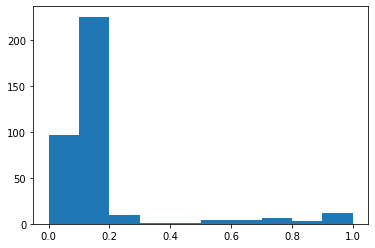

In [38]:
azdias_percentage_nans = azdias.isnull().mean()
plt.hist(azdias_percentage_nans, bins = 10);

There is however, a large number of columns in customers with 20-25% of nan values.

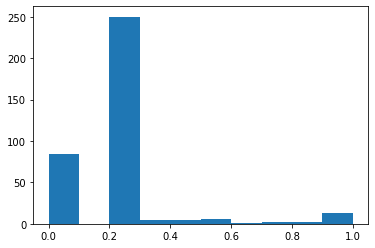

In [39]:
customers_percentage_nans = customers.isnull().mean()
plt.hist(customers_percentage_nans, bins = 10);

We will therefore drop those columns that with more than 

$$
nullc_p = 30 \%
$$

of null values in both azdias and customers. This threshold parameter is of course arbitrary and can be changed if desired.

In [40]:
def drop_nan_cols(df1, df2, nullc_p = .3):
    """
    Drops columns from df1 and df2 with more than null_p percentage of NaN values in both df1 and df2
    
    Inputs: df1, df2 - two data frames, null_p - percentange threshold of number of nan values in a column
    Returns: df1, df2 - dataframes with columns of more than null_p NaN values droped, and list of columns droped
    
    """
    #dictonaries of columns in df1 and df2 with corresponding percentage of Nans
    df1_percentage_nans = df1.isnull().mean()
    df2_percentage_nans = df2.isnull().mean()
    
    #names of colums in df1 and df2 that don't meet the threshold null_p
    nan_cols_df1 = set(df1_percentage_nans[df1_percentage_nans > nullc_p].keys())
    print('Cols in first dataframe to be dropped {} \n'.format(nan_cols_df1))
    
    nan_cols_df2 = set(df2_percentage_nans[df2_percentage_nans > nullc_p].keys())
    print('Cols in second dataframe to be dropped {} \n'.format(nan_cols_df2))
    
    #columns that don't meet the null_p in both df1 and df2
    common_nan_cols = nan_cols_df1.intersection(nan_cols_df2)
    print('Common columns to drop: {} \n'.format(common_nan_cols))
    
    print('A total of {} columns were removed from both dataframes.'.format(len(common_nan_cols)))
    
    #drop the common cols
    df1 = df1.drop(common_nan_cols, axis = 1)
    df2 = df2.drop(common_nan_cols, axis = 1)
    
    return (df1, df2)

In [41]:
azdias, customers = drop_nan_cols(azdias, customers)

Cols in first dataframe to be dropped {'ALTER_KIND4', 'D19_VERSAND_ONLINE_DATUM', 'D19_TELKO_ANZ_12', 'ALTER_KIND1', 'D19_GESAMT_ANZ_24', 'D19_BANKEN_ONLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_BANKEN_ANZ_24', 'D19_GESAMT_ONLINE_DATUM', 'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_DATUM', 'D19_VERSI_ANZ_24', 'KBA05_BAUMAX', 'TITEL_KZ', 'D19_GESAMT_OFFLINE_DATUM', 'D19_GESAMT_ANZ_12', 'D19_TELKO_DATUM', 'D19_BANKEN_ANZ_12', 'D19_VERSI_ANZ_12', 'ALTER_KIND2', 'D19_TELKO_ANZ_24', 'D19_GESAMT_DATUM', 'D19_TELKO_OFFLINE_DATUM', 'EXTSEL992', 'ALTER_KIND3', 'KK_KUNDENTYP', 'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_DATUM', 'AGER_TYP', 'D19_VERSAND_ANZ_24'} 

Cols in second dataframe to be dropped {'ALTER_KIND4', 'D19_VERSAND_ONLINE_DATUM', 'D19_TELKO_ANZ_12', 'ALTER_KIND1', 'D19_GESAMT_ANZ_24', 'D19_BANKEN_ONLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_BANKEN_ANZ_24', 'D19_GESAMT_ONLINE_DATUM', 'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_DATUM', 'D19_VERSI

Now we look at NaNs along rows of our dataframes and decide on a threshold parameter $nullr_c$ to drop rows.

In [42]:
azdias_rows_nan_per = azdias.isnull().sum(axis=1)

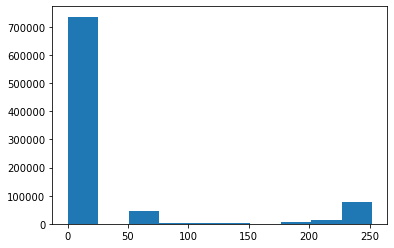

In [43]:
plt.hist(azdias_rows_nan_per, bins =10);

In [44]:
customers_rows_nan_per = customers.isnull().sum(axis=1)

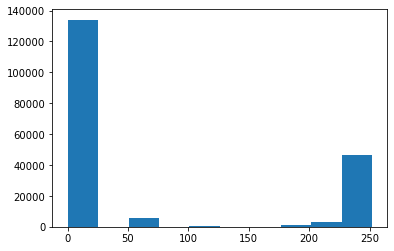

In [45]:
plt.hist(customers_rows_nan_per, bins = 10);

From these two histograms we see that most rows in both dataframes have less than 50 NaNs. Therefore we will drop rows that have more than

$$
nullr_c = 50
$$

NaN values.


In [46]:
azdias.shape[0]

891221

In [47]:
def drop_nan_rows(df, nullr_c = 50):
    """
    Input: Dataframe df and threshold nullr_c
    Returns: Dataframe df after droping those rows with more than nullr_c NaN values
    """
    nans_in_row = df.isnull().sum(axis=1)
    df_droped = df[nans_in_row <= nullr_c]
    original_n_rows = df.shape[0]
    new_n_rows = df_droped.shape[0]
    print('{} rows dropped at {} threshold from the dataframe'.format(original_n_rows - new_n_rows, nullr_c))
    #df_droped = df_droped.reset_index(drop=True)
    return df_droped

In [48]:
azdias = drop_nan_rows(azdias)

153933 rows dropped at 50 threshold from the dataframe


In [49]:
customers = drop_nan_rows(customers)

57406 rows dropped at 50 threshold from the dataframe


In [50]:
azdias.head(20)

,AKT_DAT_KL,ALTER_HH,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,...,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB
1,9.0,0.0,21.0,11.0,0.0,0.0,2.0,12.0,0.0,3.0,...,4.0,8.0,11.0,10.0,3.0,9.0,4.0,5,2,1
2,9.0,17.0,17.0,10.0,0.0,0.0,1.0,7.0,0.0,3.0,...,2.0,9.0,9.0,6.0,3.0,9.0,2.0,5,2,3
3,1.0,13.0,13.0,1.0,0.0,0.0,0.0,2.0,0.0,2.0,...,0.0,7.0,10.0,11.0,NaN,9.0,7.0,3,2,4
4,1.0,20.0,14.0,3.0,0.0,0.0,4.0,3.0,0.0,4.0,...,2.0,3.0,5.0,4.0,2.0,9.0,3.0,4,1,3
5,1.0,10.0,10.0,5.0,0.0,0.0,1.0,2.0,0.0,2.0,...,2.0,10.0,7.0,4.0,6.0,9.0,7.0,4,2,1
6,9.0,0.0,NaN,4.0,0.0,0.0,1.0,3.0,0.0,4.0,...,2.0,7.0,10.0,10.0,3.0,9.0,5.0,4,2,2
7,1.0,14.0,14.0,6.0,0.0,0.0,1.0,5.0,0.0,2.0,...,2.0,10.0,12.0,9.0,5.0,9.0,1.0,1,1,1
8,9.0,16.0,16.0,2.0,1.0,0.0,1.0,2.0,0.0,2.0,...,4.0,8.0,11.0,8.0,5.0,8.0,1.0,6,1,3
9,5.0,17.0,17.0,9.0,0.0,0.0,1.0,7.0,0.0,2.0,...,4.0,1.0,1.0,1.0,4.0,3.0,7.0,4,2,3
10,1.0,10.0,10.0,6.0,0.0,0.0,1.0,6.0,0.0,4.0,...,4.0,8.0,11.0,10.0,6.0,9.0,5.0,3,2,3


## 1.6 Categorical Columns

Next we will convert the object variables remaining to dummy variables. We'll do this only to the columns common to both azdias and customers

In [51]:
to_dummies = object_type_cols(azdias).columns
to_dummies 

Index(['D19_LETZTER_KAUF_BRANCHE', 'OST_WEST_KZ'], dtype='object')

In [52]:
def dummies(df, columns = to_dummies):
    df = pd.get_dummies(df, columns = columns)
    return df

In [53]:
azdias = dummies(azdias)
customers = dummies(customers)

## 1.6 Imputation

Now we use a mean imputer to fill in those remaining NaN values. 

In [54]:
def mean_imputer(df):
    """Fills in NaN values in numerical columns with their mean"""
    num_cols = df.select_dtypes('number')
    df[num_cols.columns] = num_cols.fillna(num_cols.mean())
    return df

In [55]:
azdias = mean_imputer(azdias)
customers = mean_imputer(customers)

In [56]:
azdias.shape, customers.shape

((737288, 367), (134246, 371))

## 1.7 Cleaning Data Function

We combine the steps above into a single function **clean_data** . The module under the same name can me imported and we can save the cleaned dataframes to load them directly.

In [57]:
import clean_data
#importlib.reload(clean_data);

In [58]:
#load demomographics and customers data
azdias = pd.read_csv('Udacity_AZDIAS_052018.csv', sep=';')
customers = pd.read_csv('Udacity_CUSTOMERS_052018.csv', sep=';')
#load attribute description and unknown values
attributes = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1)

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (18,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [59]:
clean_azdias, clean_customers = clean_data.clean_data(azdias, customers, attributes)

In [60]:
clean_azdias.shape, clean_customers.shape 

((737288, 280), (134246, 283))

In [61]:
clean_azdias.to_csv('clean_azdias.csv', index=False)
clean_customers.to_csv('clean_customers.csv', index=False)

## 1.8 Feature Scaling

In [6]:
clean_azdias = pd.read_csv('clean_azdias.csv')
clean_customers = pd.read_csv('clean_customers.csv')

As preparation for PCA and $k$-Means clustering, we scale the features on both data sets. 

In [59]:
scaler = StandardScaler()
scaler.fit(clean_azdias)

azdias = pd.DataFrame(scaler.transform(clean_azdias), columns = clean_azdias.columns)

customers_X = pd.DataFrame(scaler.transform(clean_customers[azdias.columns]), columns = clean_azdias.columns)

## 1.9 Principal Component Analysis (PCA)

Next we implement the PCA method to reduce the number of features and use combinations of the features that have more influence in the variance of our data set.

In [71]:
pca = PCA(random_state = SEED)
azdias_pc = pca.fit_transform(azdias)

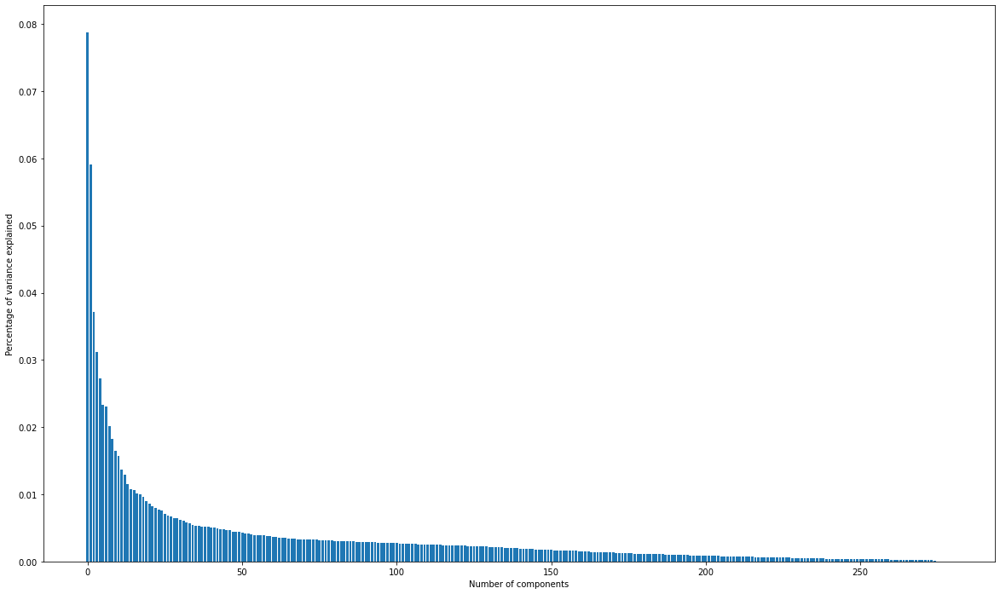

In [72]:
# Distribution of variance plot
n_azdias = azdias.shape[1]
x_axis = np.arange(n_azdias)
var_per = pca.explained_variance_ratio_
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot()
ax.set_xlabel('Number of components')
ax.set_ylabel('Percentage of variance explained')
plt.bar(x_axis, var_per)
plt.show()

In [73]:
# sorted list of cummulative sums of explained variance
cumm_var = pca.explained_variance_ratio_.cumsum()

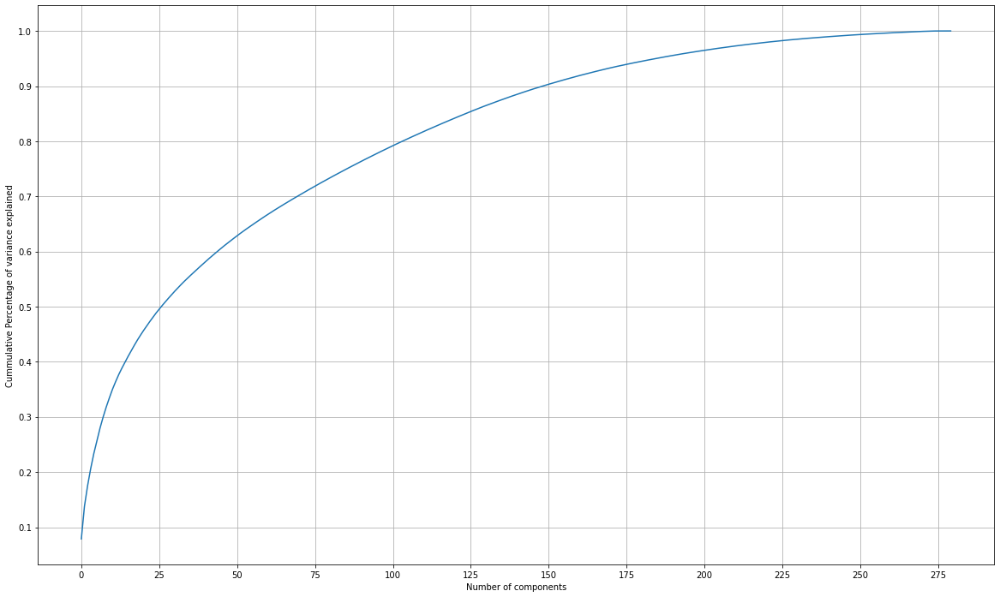

In [74]:
# plot to visualize the cummulative percentage of variance explained over the number of components
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot()
ax.set_xlabel('Number of components')
ax.set_ylabel('Cummulative Percentage of variance explained')
ax.set_xticks(np.arange(0, 325, 25))
ax.set_yticks(np.arange(0,1.1, 0.1))
ax.grid()
plt.plot(cumm_var)
plt.show()

Now we take a look at which features are weighted more heavily in the first 5 principal components. For this and for future analysis it will be useful to create a dataframe with the attributes in **azdias** and their corresponding description.

In [75]:
#Load attributes info and drop unnecessary columns
attributes_desc = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1).drop(['Unnamed: 0', 'Value', 'Meaning'], axis=1)
attributes_desc.dropna(inplace = True)

#Small modification on the name of some features in description so that they appear in 
attributes_desc['Attribute'] = [attribute[:-3] if attribute[-3:] == '_RZ' else attribute for attribute in attributes_desc.Attribute] 

#Drop those that do not appear on azdias
azdias_attributes_desc = attributes_desc.loc[attributes_desc['Attribute'].isin(azdias.columns)]

#Create a dataframe with azdias attributes in one column
azdias_attributes_df = pd.DataFrame(azdias.columns.values, columns = ['Attribute'])

#Left merge azdias_attributes_df with azdias_attributes_desc to get azdias attributes with their description
azdias_attributes_description = azdias_attributes_df.merge(azdias_attributes_desc, on = 'Attribute', how='left')

azdias_attributes_description.head(10)

,Attribute,Description
0,ALTER_HH,main age within the household
1,ANZ_HAUSHALTE_AKTIV,number of households in the building
2,ANZ_HH_TITEL,number of academic title holder in building
3,ANZ_PERSONEN,number of adult persons in the household
4,ANZ_TITEL,number of professional title holder in household
5,BALLRAUM,distance to next urban centre
6,CAMEO_DEUG_2015,CAMEO classification 2015 - Uppergroup
7,CJT_GESAMTTYP,customer journey typology
8,D19_BANKEN_DIREKT,transactional activity based on the product gr...
9,D19_BANKEN_GROSS,transactional activity based on the product gr...


In [76]:
def principal_features_info(features, components, variance_ratio, i, n):
    """
    Inputs: features - array with names of features in dataframe
            components - principal components from PCA
            variance_ratio - percentage of variance explained by each of the selected components
            i - index of principal component
            n - number of features in ith components
    Retuns: Printout of the percentage explained by the ith principal component, features in the component,
            their weights, and description according to DIAS Attributes - Values 2017.xlsx
    """
    feature_weights = dict(zip(features, components[i]))
    feature_weights_sorted = sorted(feature_weights.items(), key = lambda weight: weight[1])
    print('About {}% variance explained by PC{}'.format(round(variance_ratio[i]*100,2), i+1))
    print('Lowest:')
    for feature, weight in feature_weights_sorted[:n]:
        desc = azdias_attributes_description[azdias_attributes_description['Attribute'] == feature].Description.item()
        print('\t{:.3f} {:30} {}'.format(weight, feature, desc))
        
    print('Highest:')
    for feature, weight in feature_weights_sorted[-n:]:
        desc = azdias_attributes_description[azdias_attributes_description['Attribute'] == feature].Description.item()
        print('\t{:.3f} {:30}  {:20}'.format(weight, feature, desc))
    print('\t')    
    

Here's a summary of the first 10 principal components.

In [77]:
for i in range(9):
    principal_features_info(azdias.columns.values, pca.components_,pca.explained_variance_ratio_, i, 5)

About 7.88% variance explained by PC1
Lowest:
	-0.152 HH_EINKOMMEN_SCORE             estimated household net income 
	-0.148 CAMEO_DEUG_2015                CAMEO classification 2015 - Uppergroup
	-0.143 PLZ8_ANTG3                     number of 6-10 family houses in the PLZ8
	-0.138 PLZ8_ANTG4                     number of >10 family houses in the PLZ8
	-0.137 PLZ8_BAUMAX                    most common building-type within the PLZ8
Highest:
	0.146 LP_STATUS_GROB                  social status rough 
	0.147 LP_STATUS_FEIN                  social status fine  
	0.148 KBA05_ANTG1                     number of 1-2 family houses in the cell
	0.148 PLZ8_ANTG1                      number of 1-2 family houses in the PLZ8
	0.155 MOBI_REGIO                      moving patterns     
	
About 5.91% variance explained by PC2
Lowest:
	-0.145 KBA13_SITZE_5                  number of cars with 5 seats in the PLZ8
	-0.133 KBA13_ALTERHALTER_60           share of car owners between 46 and 60 within the PLZ

The next function generates a data frame with the principal components of a dataframe. 

In [8]:
def pca_df(data, var_per):
    """
    Inputs:  data - data frame 
             var_per - float in [0,1]
    Returns: pca class of data
             data frame with PC that explain var_per% of the variance of data
    """
    #instantiate PCA 
    pca = PCA(random_state=SEED)
    data_pca = pca.fit_transform(data)
    cumm_var = pca.explained_variance_ratio_.cumsum()
    #number of columns that explain var_per% of variance
    n = np.argmax(cumm_var >= var_per)
    #fit data to PC
    pca.fit(data)
    #values of output dataframe
    data_PC_values = pca.transform(data)
    #names of columns in output dataframe
    col_names = ['PC' + str(k) for k in range(1, data.shape[1]+1)]
    #drop cols not necessary to explain % of variance desired
    data_PC = pd.DataFrame(data_PC_values, columns = col_names).iloc[:,:(n-1)]
    
    return pca, data_PC

In [36]:
azdias_pca, azdias_pc_50 = pca_df(azdias, .5)

We use the azdias PCA projection to reduce the dimension of our customer matrix according to azdias principal components.

In [53]:
customers_X_pc_50 = azdias_pca.transform(customers_X)
col_names = ['PC' + str(k) for k in range(1,customers_X.shape[1]+1)]
customers_X_pc_50 = pd.DataFrame(customers_X_pc_50, columns = col_names).iloc[:,:25]

In [56]:
azdias_pc_50.to_csv('azdias_pc_50.csv', index=False)
customers_X_pc_50.to_csv('customers_X_pc_50.csv', index=False)

# Part 2: Customer Segmentation Report

The main bulk of your analysis will come in this part of the project. Here, you should use unsupervised learning techniques to describe the relationship between the demographics of the company's existing customers and the general population of Germany. By the end of this part, you should be able to describe parts of the general population that are more likely to be part of the mail-order company's main customer base, and which parts of the general population are less so.

In [ ]:
#Load the azdias and customers principal components at 50% variance
azdias_pc_50 = pd.read_csv('azdias_pc_50.csv')
customers_X_pc_50 = pd.read_csv('customers_X_pc_50.csv')

## 2.1 Clustering

We know implement $k$-means clustering to identify segments in the population of Germany. To determine the optimal number of clusters, we use the Elbow Method with the **interia** of k-mean clustering for $k=3,4,\ldots,15$.

Recall that the **intertia** of the clusters is defined as the sum of squared Euclidean distances of samples to the closest cluster center. Here are the results using different values of inertia.

In [86]:
inertias = [] 
mapping = {} 
K = range(3,16)

for k in K:
    # build and fit model
    kmean = KMeans(n_clusters=k, random_state=SEED).fit(azdias_pc_50)
    kmean = kmean.fit(azdias_pc_50)
    
    inertias.append(kmean.inertia_) 

    mapping[k] = kmean.inertia_
    
fig = plt.figure(figsize=(20, 12))
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of k') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

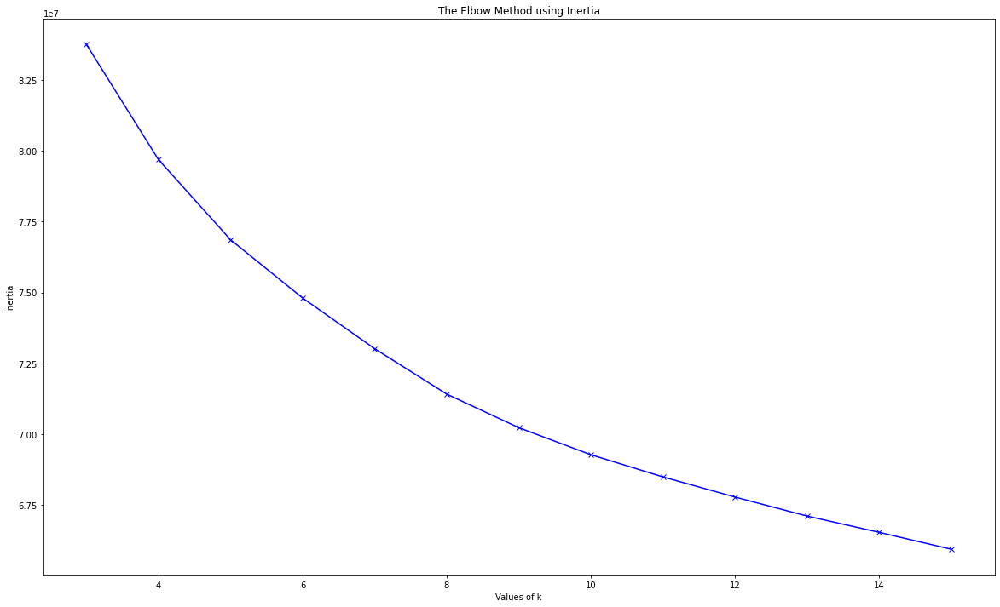

Both distortion and intertia seem to be deacreasing linearly after $k=8$, so we conclude that 8 is an appropiate number of clusters for our model.

In [140]:
#Train clustering model with k=8
kmeans = KMeans(n_clusters = 8)
clusters_model = kmeans.fit(azdias_pc_50)

## 2.2 Distribution of customers among clusters

Now we move to explore how these 8 clusters are populated. Specifically, how the costumers are distributed among these clusters. The following bar plot helps us visualize the distribution among the 8 clusters.

In [141]:
#Train clustering model with k=8
kmeans = MiniBatchKMeans(n_clusters=8, batch_size=100)
clusters_model = kmeans.fit(azdias_pc_50)

#Predict the cluster of each sample using the above model
azdias_clusters = kmeans.predict(azdias_pc_50)
customers_clusters = kmeans.predict(customers_X_pc_50)

#Create a dataframe with number of people and customers on each cluster
cluster_distribution = pd.DataFrame([])
cluster_distribution['Population'] = pd.value_counts(azdias_clusters).sort_index()
cluster_distribution['Customers'] = pd.value_counts(customers_clusters).sort_index()
cluster_distribution.reset_index(inplace=True)
cluster_distribution.rename(columns={"index":"Cluster"}, inplace=True)

#Bar graph with general population and customers distribution on clusters
bar_w = .25
x1 = np.arange(8)
x2 = [x + bar_w for x in x1]
plt.figure(figsize = (16,10))
plt.bar(x1, cluster_distribution["Population"].values, color = 'orange', width = bar_w, label = 'Germany Population')
plt.bar(x2, cluster_distribution["Customers"].values, color = 'royalblue', width = bar_w, label = 'Customers')
plt.xlabel('Cluster')
plt.xticks([r + bar_w/2 for r in range(8)],['0', '1', '2', '3', '4', '5', '6', '7'])
plt.legend()
plt.show;

#table with summary of distributions
interest_clusters = cluster_distribution[cluster_distribution['Customers'].notna()]
print(interest_clusters[['Cluster' , 'Population' , 'Customers']])
num_customers = cluster_distribution.Customers.sum()
for i in interest_clusters.Cluster.values:
    #print('CLUSTER '+str(i)+':')
    number = interest_clusters.loc[i].Customers
    print('\n\033[1mCLUSTER ' + str(i) + '\033[0m contains about {}% of customers'.format(round(100*(number/num_customers))))
    if number > interest_clusters.loc[i].Population:
        print('Customers are \033[1m' + 'overrepresented' '\033[0m in this cluster\n')
    else:
        print ('Customers are \033[1m' + 'underrepresented' '\033[0m in this cluster \n')
    

Recall that there the original **azdias** and **customers** data had 88246 common samples so there is probably some overlap in these clusters of interest.

# NEEDS REVISION AFTER THE CLUSTERING CHANGED

## 2.3 Analysis of features in clusters of interest

The centers of clusters 0, 1 and 6 will be used identify special characteristics of the average person in each of these clusters.

In [92]:
#create data frame with centers of clusters 0, 1, and 6
clusters_centers = pd.DataFrame(kmeans.cluster_centers_[[0,1,6],:], index = [0, 1, 6])
clusters_centers.columns = ['PC'+str(k) for k in range(1,26)]
clusters_centers.index.name = 'Center of Cluster'
clusters_centers.sort_index(ascending = True)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
Center of Cluster,,,,,,,,,,,,,,,,,,,,,
0,-2.897483,0.564845,-2.095833,-1.289694,1.873283,-0.616031,0.087202,0.311681,-1.351499,-0.355391,...,0.016939,0.004200,0.164926,0.285509,-0.090787,0.094269,-0.151294,-0.240198,-0.011574,-0.059964
1,-0.139329,-6.479195,-1.163659,1.841868,-2.462057,0.624916,-0.174715,-1.032960,1.794910,-0.289098,...,-0.000030,0.138848,-0.327045,-0.193056,0.036445,0.094878,0.019844,0.084776,0.190042,-0.166022
6,3.582558,-1.300362,-1.842842,-2.400347,-0.077867,0.457723,0.228055,0.016818,0.152243,0.533315,...,0.070941,-0.042993,-0.070989,-0.226557,-0.075885,-0.051055,0.079542,-0.014850,-0.018968,0.160386


We use skitlearn's **inverse_transform** function to express the centers of these clusters in the original features. Note that we used the first 25 principal components in our cluster analysis so we'll need to augment the dimension of these rows to the original 280 by padding them with zeros.

In [93]:
#pad the centers principal components with zeros for the remaining principal components
for l in range(26, 281):
    clusters_centers['PC'+str(l)] = 0

# Use inverse PCA and scaling to center values as original variables
centers_df = azdias_pca.inverse_transform(azdias_pca.inverse_transform(clusters_centers))
centers_df = pd.DataFrame(centers_df, columns=azdias.columns, index = ['cluster_0','cluster_1','cluster_6'])
centers_df

,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_PERSONEN,ANZ_TITEL,BALLRAUM,CAMEO_DEUG_2015,CJT_GESAMTTYP,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,...,SHOPPER_TYP,VERS_TYP,W_KEIT_KIND_HH,WOHNDAUER_2008,WOHNLAGE,ZABEOTYP,ANREDE_KZ,ALTERSKATEGORIE_GROB,OST_WEST_KZ_O,OST_WEST_KZ_W
cluster_0,0.014021,-0.131653,-0.308628,-0.345902,-0.063146,0.090997,0.222263,-0.011660,-0.111019,0.243672,...,-0.516177,-0.151526,0.267587,0.132159,-0.005220,0.016380,-0.420149,-0.062979,-0.379193,-0.156275
cluster_1,-0.251923,0.359168,0.090371,-0.073702,-0.222014,-0.468315,-1.160063,0.220802,0.110887,0.174001,...,0.058896,0.744902,-0.419603,-0.193795,0.574677,0.047220,0.088277,-0.542801,1.381289,1.475814
cluster_6,-0.255441,-0.307599,-0.132438,0.188507,-0.062540,0.285793,0.096968,-0.291005,0.458825,0.365727,...,0.085462,-0.013080,0.371290,0.013231,-0.135698,-0.148634,0.226665,0.190133,-0.110935,-0.634171


### Cluster 6

This is the most interesting cluster since it shows the largest concentration of custormers. Its center can be used to identify segments of the population that best describe the core customer base of the company.

In [94]:
from scipy import stats

In [95]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 6 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_6'][col])
    if percentile>75:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, {}'.format(col, description))
        print('\n')

D19_BANKEN_DIREKT, transactional activity based on the product group DIRECT BANKS


D19_BANKEN_GROSS, transactional activity based on the product group BIG BANKS


D19_BANKEN_ONLINE_QUOTE_12, amount of online transactions within all transactions in the segment bank 


D19_BANKEN_REST, transactional activity based on the product group FURTHER BANKS


D19_BEKLEIDUNG_GEH, transactional activity based on the product group LUXURY CLOTHING


D19_BEKLEIDUNG_REST, transactional activity based on the product group FURTHER CLOTHING


D19_BILDUNG, transactional activity based on the product group EDUCATION


D19_DIGIT_SERV, transactional activity based on the product group DIGITAL SERVICES


D19_DROGERIEARTIKEL, transactional activity based on the product group DRUGSTORES


D19_ENERGIE, transactional activity based on the product group ENERGY


D19_FREIZEIT, transactional activity based on the product group LEISURE PRODUCTS


D19_GARTEN, transactional activity based on the product group GARDENING

These results indicate that the average person in cluster 6 is likely to have several academic and professional titles, live in a high income houshold in east Germany, and is a buyer that has been actively purchasing digital, gardening, dietary, and animal producs on the platform for more than a year.

Let's now inspect which features of center of cluster 6 that have very low percentile rank.

In [96]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 6 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_6'][col])
    if percentile<25:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, {}'.format(col, description))
        print('\n')

ANZ_HH_TITEL, number of academic title holder in building


ANZ_TITEL, number of professional title holder in household 


D19_BANKEN_LOKAL, transactional activity based on the product group LOCAL BANKS


D19_BIO_OEKO, transactional activity based on the product group ECOLOGICALS


D19_LEBENSMITTEL, transactional activity based on the product group FOOD PRODUCTS 


D19_NAHRUNGSERGAENZUNG, transactional activity based on the product group DIETARY SUPPLEMENTS


D19_SAMMELARTIKEL, transactional activity based on the product group COLLECTABLE ITEMS


KBA05_ALTER4, share of cars owners elder than 61 years


KBA05_KRSKLEIN, share of small cars (referred to the county average)


KBA05_KRSOBER, share of upper class cars (referred to the county average)


KBA05_KRSVAN, share of vans (referred to the county average)


KBA13_BJ_2008, share of cars built in 2008 within the PLZ8


KBA13_FIAT, share of FIAT within the PLZ8


KBA13_HALTER_65, share of car owners between 61 and 65 within the PLZ8


KB

From this we can conclude that a person in this cluster is likely to live in a good neighborhood, is a green and smart type of consumer, and their moving patterns show high mobility.

### Cluster 0

The following are the features of the average person in **Cluster 0** that have a value greater than most of Germany's population.

In [97]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 0 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_0'][col])
    if percentile>95:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, {}'.format(col, description))
        print('\n')

D19_BANKEN_LOKAL, transactional activity based on the product group LOCAL BANKS


D19_BIO_OEKO, transactional activity based on the product group ECOLOGICALS


D19_GARTEN, transactional activity based on the product group GARDENING PRODUCTS


D19_NAHRUNGSERGAENZUNG, transactional activity based on the product group DIETARY SUPPLEMENTS




People in this cluster are also likely to have several academic and professional titles, have been actively purchasing on the platform for more than a year ecological, digital, gardenig, animal an dietary products. 

The following are features of the average person in cluster 0 that have a value lower than 85% of the population.

In [98]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 0 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_0'][col])
    if percentile<20:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, {}'.format(col, description))
        print('\n')

ANZ_HH_TITEL, number of academic title holder in building


ANZ_TITEL, number of professional title holder in household 


D19_DIGIT_SERV, transactional activity based on the product group DIGITAL SERVICES


D19_FREIZEIT, transactional activity based on the product group LEISURE PRODUCTS


D19_HANDWERK, transactional activity based on the product group DO-IT-YOURSELF PRODUCTS 


D19_RATGEBER, transactional activity based on the product group GUIDEBOOKS


D19_TIERARTIKEL, transactional activity based on the product group ANIMAL PRODUCTS


D19_WEIN_FEINKOST, transactional activity based on the product group WINE AND GOURMET FOOD


KBA05_ZUL3, share of cars built between 2001 and 2002


KBA13_KRSSEG_KLEIN, share of small cars (referred to the county average) - PLZ8


KBA13_KRSSEG_OBER, share of upper class cars (referred to the county average) - PLZ8




A tipical person in cluster 0 is likely to be an upper class conservative, live in postal code areas with few numbers of households, and have high purchasing power.

### Cluster 1

In [99]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 1 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_1'][col])
    if percentile>90:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, \t{:50}'.format(col, description))
        print('\n')

ANZ_HH_TITEL, 	number of academic title holder in building       


D19_BANKEN_LOKAL, 	transactional activity based on the product group LOCAL BANKS


D19_BANKEN_ONLINE_QUOTE_12, 	amount of online transactions within all transactions in the segment bank 


D19_BANKEN_REST, 	transactional activity based on the product group FURTHER BANKS


D19_BEKLEIDUNG_GEH, 	transactional activity based on the product group LUXURY CLOTHING


D19_BILDUNG, 	transactional activity based on the product group EDUCATION


D19_BIO_OEKO, 	transactional activity based on the product group ECOLOGICALS


D19_DIGIT_SERV, 	transactional activity based on the product group DIGITAL SERVICES


D19_GARTEN, 	transactional activity based on the product group GARDENING PRODUCTS


D19_LEBENSMITTEL, 	transactional activity based on the product group FOOD PRODUCTS 


D19_NAHRUNGSERGAENZUNG, 	transactional activity based on the product group DIETARY SUPPLEMENTS


D19_TIERARTIKEL, 	transactional activity based on the product 

From these results we conclude that an average person in cluster 1 is likely to live in an area with a high number of buildings, is potentially an immigrant or has assimilated names, and has been actively purchasing on the platform for more than a year ecological, digital, gardenig, animal, dietary, luxury clothing, wine and gourmet products.

In [100]:
for col in azdias.columns:
    #Compute the percentile rank of each feature of center 1 relative to the overall population
    percentile = stats.percentileofscore(azdias[col].values,centers_df.loc['cluster_1'][col])
    if percentile<25:
        description = azdias_attributes_description[azdias_attributes_description['Attribute'] == col]['Description'].item()
        print('{}, \t{:50}'.format(col, description))
        print('\n')

ANZ_TITEL, 	number of professional title holder in household  


CAMEO_DEUG_2015, 	CAMEO classification 2015 - Uppergroup            


D19_DROGERIEARTIKEL, 	transactional activity based on the product group DRUGSTORES


D19_ENERGIE, 	transactional activity based on the product group ENERGY


D19_KOSMETIK, 	transactional activity based on the product group COSMETIC PRODUCTS 


D19_WEIN_FEINKOST, 	transactional activity based on the product group WINE AND GOURMET FOOD


GEBAEUDETYP, 	type of building (residential or commercial)      


HEALTH_TYP, 	health typology                                   


HH_EINKOMMEN_SCORE, 	estimated household net income                    


KBA05_ALTER4, 	share of cars owners elder than 61 years          


KBA05_KRSOBER, 	share of upper class cars (referred to the county average)


KBA05_KRSVAN, 	share of vans (referred to the county average)    


KBA13_ALTERHALTER_61, 	share of car owners elder than 61 within the PLZ8 


KBA13_BJ_2004, 	share of cars 

An average person in cluster 1 is likely to have few academic and professional titles, only recently has been purchasing ecological, food, dietary products. Finally, a person in cluster 1 is likely to live in an area where the share of cars per houshold is low and their length of residency is lower than the general population.

## Part 2: Supervised Learning Model

Now that you've found which parts of the population are more likely to be customers of the mail-order company, it's time to build a prediction model. Each of the rows in the "MAILOUT" data files represents an individual that was targeted for a mailout campaign. Ideally, we should be able to use the demographic information from each individual to decide whether or not it will be worth it to include that person in the campaign.

The "MAILOUT" data has been split into two approximately equal parts, each with almost 43 000 data rows. In this part, you can verify your model with the "TRAIN" partition, which includes a column, "RESPONSE", that states whether or not a person became a customer of the company following the campaign. In the next part, you'll need to create predictions on the "TEST" partition, where the "RESPONSE" column has been withheld.

## 2.1 Preprocessing of data sets

We'll process the training and test data sets using the **clean_data** function but in this case we won't drop any rows of columns with large number of nans.

In [101]:
#load data sets again
azdias_raw = pd.read_csv('Udacity_AZDIAS_052018.csv', sep=';')
attributes = pd.read_excel('DIAS Attributes - Values 2017.xlsx', header=1)
mailout_train = pd.read_csv('Udacity_MAILOUT_052018_TRAIN.csv', sep=';')
mailout_test = pd.read_csv('Udacity_MAILOUT_052018_TEST.csv', sep=';')

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (18,19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [102]:
def supervised_data(azdias_raw, customers, attributes):
    """Cleans and processes customer information for supervised models
    Args: azdias_raw - general population data set 
          customers - customers data set
          attributes - features information
    Returns: clean_customers - clean version of customers without unnecessary columns (LNR,'CAMEO_DEU_2015','CAMEO_INTL_2015', 'D19_LETZTER_KAUF_BRANCHE', 'EINGEFUEGT_AM', 'LNR','OST_WEST_KZ' ), but no rows or large percentage of nan cols are dropped

    """
    n_cols = customers.shape[1]
    _ , clean_customers = clean_data.clean_data(azdias_raw, customers, attributes, 1, n_cols)
    missing_cols = set(customers.columns) - set(clean_customers.columns)
    cols_to_add  = set(customers.columns)-set(clean_customers)-set(customers[missing_cols].select_dtypes(np.dtype("O")).columns)-{'LNR'}
    df_to_concat = customers[cols_to_add]
    clean_customers = pd.concat([clean_customers, df_to_concat], axis = 1)
    #impute values with the column mean
    clean_customers = clean_data.mean_imputer(clean_customers)
    return clean_customers

In [103]:
clean_mailout_train = supervised_data(azdias_raw, mailout_train, attributes)

We save this dataframe to simply download a cleaned version of the mailout_train data set in the future.

In [104]:
clean_mailout_train.to_csv('clean_mailout_train.csv', index=False)

In [14]:
#load cleaned MAILOUT and TRAIN data sets
clean_mailout_train = pd.read_csv('clean_mailout_train.csv')

## 2.2 Feature Engineering Using Clusters

To incorporate the information obtained from the customer segmentation, the cluster labels will be used as features in our supervised machine learning model. The idea is to make the samples that are in clusters 2 and 4 weigh more in the classification process. For this will add a binary label to each sample if they are in clusters 2 or 4.

In [2]:
#Load the azdias and customers principal components at 50% variance
azdias_pc_50 = pd.read_csv('azdias_pc_50.csv')
customers_X_pc_50 = pd.read_csv('customers_X_pc_50.csv')

   Cluster  Population  Customers
6        6       78063   134246.0

CLUSTER 6 contains about 100.0% of customers
Customers are overrepresented in this cluster



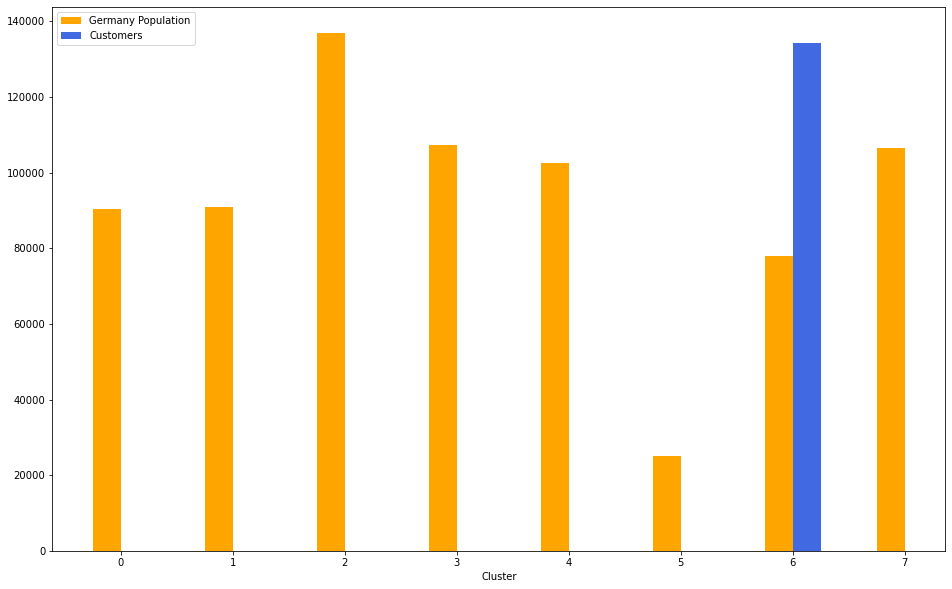

In [4]:
#Train clustering model with k=8
kmeans = MiniBatchKMeans(n_clusters=8, batch_size=100)
clusters_model = kmeans.fit(azdias_pc_50)

#Predict the cluster of each sample using the above model
azdias_clusters = kmeans.predict(azdias_pc_50)
customers_clusters = kmeans.predict(customers_X_pc_50)

#Create a dataframe with number of people and customers on each cluster
cluster_distribution = pd.DataFrame([])
cluster_distribution['Population'] = pd.value_counts(azdias_clusters).sort_index()
cluster_distribution['Customers'] = pd.value_counts(customers_clusters).sort_index()
cluster_distribution.reset_index(inplace=True)
cluster_distribution.rename(columns={"index":"Cluster"}, inplace=True)

#Bar graph with general population and customers distribution on clusters
bar_w = .25
x1 = np.arange(8)
x2 = [x + bar_w for x in x1]
plt.figure(figsize = (16,10))
plt.bar(x1, cluster_distribution["Population"].values, color = 'orange', width = bar_w, label = 'Germany Population')
plt.bar(x2, cluster_distribution["Customers"].values, color = 'royalblue', width = bar_w, label = 'Customers')
plt.xlabel('Cluster')
plt.xticks([r + bar_w/2 for r in range(8)],['0', '1', '2', '3', '4', '5', '6', '7'])
plt.legend()
plt.show;

#table with summary of distributions
interest_clusters = cluster_distribution[cluster_distribution['Customers'].notna()]
print(interest_clusters[['Cluster' , 'Population' , 'Customers']])
num_customers = cluster_distribution.Customers.sum()
for i in interest_clusters.Cluster.values:
    #print('CLUSTER '+str(i)+':')
    number = interest_clusters.loc[i].Customers
    print('\n\033[1mCLUSTER ' + str(i) + '\033[0m contains about {}% of customers'.format(round(100*(number/num_customers))))
    if number > interest_clusters.loc[i].Population:
        print('Customers are \033[1m' + 'overrepresented' '\033[0m in this cluster\n')
    else:
        print ('Customers are \033[1m' + 'underrepresented' '\033[0m in this cluster \n')

In [12]:
def add_cluster_feature (customers, azdias, pca = azdias_pca, scaler = scaler, kmeans = kmeans):
    """Adds cluster column to clean customer data. Adds a 1 if row is in cluster of interest and 0 else
    Args: customers - cleaned dataframe of customers
          azdias - cleaned general pop dataframe
          pca - azdias pca model
          scaler - azdias scaler model
          kmeans - azdias kmeans model
    Returns: customers with cluster encoding feature column 

    """
    #Save labels
    labels  = customers['RESPONSE']
    #drop labels to perform pca+clustering
    customers_X = customers.drop(['RESPONSE'], axis=1, inplace = False)
    customers_azdia_reescaled = pd.DataFrame(scaler.transform(customers_X[azdias.columns]), columns = azdias.columns)
    customers_X_pc_50 = pca.transform(customers_azdia_reescaled)
    customers_X_pc_50 = pd.DataFrame(customers_X_pc_50).iloc[:,:25]
    customers_clusters = kmeans.predict(customers_X_pc_50)
    customers_scaler = StandardScaler()
    customers_with_cluster = pd.DataFrame(customers_scaler.fit_transform(customers_X), columns = customers_X.columns)
    customers_with_cluster['Clusters'] = customers_clusters
    #replace cluster values for 1 on 0 depending if they are clusters of interest
    customers_with_cluster.Clusters.replace({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:1, 7:0}, inplace = True)
    return customers_with_cluster, labels

In [15]:
mailout_train_cluster, labels = add_cluster_feature(clean_mailout_train, azdias, azdias_pca, scaler, kmeans)

In [16]:
clean_mailout_train.drop(['RESPONSE'], axis=1, inplace = True)

## 2.3 Logistic Regression Benchmark

With Clusters:

In [17]:
mailout_train_cluster.shape

(42962, 363)

In [18]:
X_train, X_val, y_train, y_val = train_test_split(mailout_train_cluster, labels, stratify = labels, test_size=0.2)
logistic_reg = LogisticRegression(random_state =SEED, class_weight = 'balanced', multi_class = 'ovr')
logistic_reg.fit(X_train, y_train)
predictions = logistic_reg.predict_proba(X_val)[:,1]
print('Baseline AUROC: ', roc_auc_score(y_val, predictions))

Baseline AUROC:  0.6850104821802935


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Without Clusters:

In [19]:
clean_mailout_train.shape

(42962, 362)

In [20]:
X_train, X_val, y_train, y_val = train_test_split(clean_mailout_train, labels, stratify = labels, test_size=0.2)
logistic_reg = LogisticRegression(random_state =SEED, class_weight = 'balanced', multi_class = 'ovr')
logistic_reg.fit(X_train, y_train)
predictions = logistic_reg.predict_proba(X_val)[:,1]
print('Baseline AUROC: ', roc_auc_score(y_val, predictions))

Baseline AUROC:  0.689655210744068


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## 2.4 Other Models

In [22]:
def roc_time(model, X_train, y_train, X_test, y_test):
    "Fits model, predicts and outputs AUROC score and time it took"
    start = time.time()
    model = model.fit(X_train, y_train)
    
    roc_score = roc_auc_score(y_test, model.predict_proba(X_test)[:,1])
    
    end = time.time()
    time_elap = end - start
    return roc_score, time_elap

With cluster feature

In [23]:
X_train, X_val, y_train, y_val = train_test_split(mailout_train_cluster, labels, stratify = labels, test_size=0.2)
models = [("LogisticRegression", LogisticRegression(random_state=SEED)),
         ("DecisionTreeClassifier", DecisionTreeClassifier(random_state=SEED)),
         ("RandomForestClassifier", RandomForestClassifier(random_state=SEED)),
         ("GradientBoostingClassifier", GradientBoostingClassifier(random_state=SEED)),
         ("AdaBoostClassifier", AdaBoostClassifier(random_state=SEED))]

results = {'Model':[],
          'AUCROC score':[],
          'Seconds':[]}

for name, model in models:
    roc, time_ = roc_time(model, X_train, y_train, X_val, y_val)
    results['Model'].append(name)
    results['AUCROC score'].append(roc)
    results['Seconds'].append(time_)
    
pd.DataFrame.from_dict(results, orient = 'index').transpose()

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Model,AUCROC score,Seconds
0,LogisticRegression,0.625161,1.17422
1,DecisionTreeClassifier,0.478021,2.18967
2,RandomForestClassifier,0.601245,8.75282
3,GradientBoostingClassifier,0.765463,43.7191
4,AdaBoostClassifier,0.731697,9.7971


## Grid Search

### AdaBoost 

In [24]:
param_grid = {"n_estimators": [50,100,150,200],
              "learning_rate": [0.01,0.1,0.5,0.9,1.],
              "algorithm":["SAMME.R"]
              }

adaboost_grid = GridSearchCV(estimator = AdaBoostClassifier(random_state=42), 
                           param_grid = param_grid, 
                           scoring = "roc_auc", 
                           cv = 5, n_jobs = -1, verbose=2)

In [25]:
X_train, X_val, y_train, y_val = train_test_split(mailout_train_cluster, labels, stratify = labels, test_size=0.2)

In [26]:
%%time
adaboost_grid.fit(X_train, y_train)

best_adaboost = adaboost_grid.best_estimator_

print("Best Score: ", adaboost_grid.best_score_)
print("Best Params: ", adaboost_grid.best_params_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 10.5min finished


Best Score:  0.7721864947557793
Best Params:  {'algorithm': 'SAMME.R', 'learning_rate': 0.1, 'n_estimators': 100}
CPU times: user 19.7 s, sys: 809 ms, total: 20.5 s
Wall time: 10min 50s


## Gradient Boosting Classifier

In [31]:
X_train, X_val, y_train, y_val = train_test_split(mailout_train_cluster, labels, stratify = labels, test_size=0.2)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(clean_mailout_train, labels, stratify = labels, test_size=0.2)

In [28]:
mailout_train_cluster.shape, clean_mailout_train.shape

((42962, 363), (42962, 362))

In [33]:
grad_param_grid = {"n_estimators": [60, 80, 100],
              "learning_rate": [0.15,0.1],
              "max_depth": [2, 3, 4,5,6,7],
              "min_samples_split": [3, 4, 5]
              }

In [34]:
gradient_boost_grid = GridSearchCV(estimator = GradientBoostingClassifier(), 
                           param_grid = grad_param_grid, 
                           scoring = "roc_auc", 
                           cv = 5, n_jobs = -1, verbose=2)

The next search is with clusters

In [35]:
%%time
gradient_boost_grid.fit(X_train, y_train)

best_gradient_boost = gradient_boost_grid.best_estimator_

print("Best Score: ", gradient_boost_grid.best_score_)
print("Best Params: ", gradient_boost_grid.best_params_)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 23.8min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 66.4min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed: 110.6min finished


Best Score:  0.7670150425913782
Best Params:  {'learning_rate': 0.1, 'max_depth': 2, 'min_samples_split': 3, 'n_estimators': 60}
CPU times: user 19.3 s, sys: 695 ms, total: 20 s
Wall time: 1h 50min 55s


10 trials with cluster data

In [126]:
scores = []
for i in range(10):
    X_train, X_val, y_train, y_val = train_test_split(mailout_train_cluster, labels, stratify = labels, test_size=0.2)
    grad_boost = GradientBoostingClassifier(learning_rate =  0.1, max_depth = 3, min_samples_split = 5, n_estimators = 50)
    grad_boost.fit(X_train, y_train)
    predictions = grad_boost.predict_proba(X_val)[:,1]
    score = roc_auc_score(y_val, predictions)
    print(score)
    scores.append(score)
print('Grad Boost 10-trials mean AUROC: ', st.mean(scores))

0.7939378983617564
0.7370095440084834
0.7831027920615548
0.7573575346089803
0.767850274893233
0.7614025668558573
0.7865681363950637
0.7079551189277273
0.7508948202689575
0.7674873446847676


NameError: name 'st' is not defined

In [128]:
print('Grad Boost 10-trials mean AUROC: ', st.mean(scores))

Grad Boost 10-trials mean AUROC:  0.7613566031066381


10 trials without cluster data

In [129]:
scores = []
for i in range(10):
    X_train, X_val, y_train, y_val = train_test_split(clean_mailout_train, labels, stratify = labels, test_size=0.2)
    grad_boost = GradientBoostingClassifier(learning_rate =  0.1, max_depth = 3, min_samples_split = 5, n_estimators = 50)
    grad_boost.fit(X_train, y_train)
    predictions = grad_boost.predict_proba(X_val)[:,1]
    score = roc_auc_score(y_val, predictions)
    print(score)
    scores.append(score)
print('Grad Boost 10-trials mean AUROC -no cluster: ', st.mean(scores))

0.7681087167721554
0.795919841889149
0.7729062873073358
0.7898450682620033
0.7831383625567182
0.7695120839641538
0.762254035583834
0.7772642287538544
0.7520964360587002
0.7379260400479313
Grad Boost 10-trials mean AUROC -no cluster:  0.7708971101195835


## Part 3: Kaggle Competition

Now that you've created a model to predict which individuals are most likely to respond to a mailout campaign, it's time to test that model in competition through Kaggle. If you click on the link [here](http://www.kaggle.com/t/21e6d45d4c574c7fa2d868f0e8c83140), you'll be taken to the competition page where, if you have a Kaggle account, you can enter. If you're one of the top performers, you may have the chance to be contacted by a hiring manager from Arvato or Bertelsmann for an interview!

Your entry to the competition should be a CSV file with two columns. The first column should be a copy of "LNR", which acts as an ID number for each individual in the "TEST" partition. The second column, "RESPONSE", should be some measure of how likely each individual became a customer – this might not be a straightforward probability. As you should have found in Part 2, there is a large output class imbalance, where most individuals did not respond to the mailout. Thus, predicting individual classes and using accuracy does not seem to be an appropriate performance evaluation method. Instead, the competition will be using AUC to evaluate performance. The exact values of the "RESPONSE" column do not matter as much: only that the higher values try to capture as many of the actual customers as possible, early in the ROC curve sweep.

In [ ]:
mailout_test = pd.read_csv('../../data/Term2/capstone/arvato_data/Udacity_MAILOUT_052018_TEST.csv', sep=';')